# 🐕‍🦺 End-to-End Multi-class Dog Breed Clasification

This notebook builds an end-to-end multiclass image
classifier using TenserFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identiying the breed of a dog, given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog , I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning / transfer learning.

* There are 120 breeds of a dog (this means there are 120 different classes).

* There are around 10,000+ images in the training set (these images have labels)

* There are around 10,000+ images in the test set (these images have no labels , because we have to predict the breed).

Unzip the data that we have uploaded on the google drive.

In [1]:
# !unzip "drive/MyDrive/dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/dog Vision/"

### Get our workspace ready ✅

* Import tenserflow
* Import Tenserflow Hub
* Make sure we're using a GPU

In [2]:
# Import TenserFlow and necessary tools into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:" , hub.__version__)

# Check for GPU availibility
print("GPU" , "available (YES!!!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.12.0
TF Hub version: 0.14.0
GPU available (YES!!!!!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models , our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [3]:
# Importing as per requirements
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn

%matplotlib inline


# Checkout the labels of our data
labels_csv = pd.read_csv("drive/MyDrive/dog Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [4]:
# How many images are there of each breed ?

labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

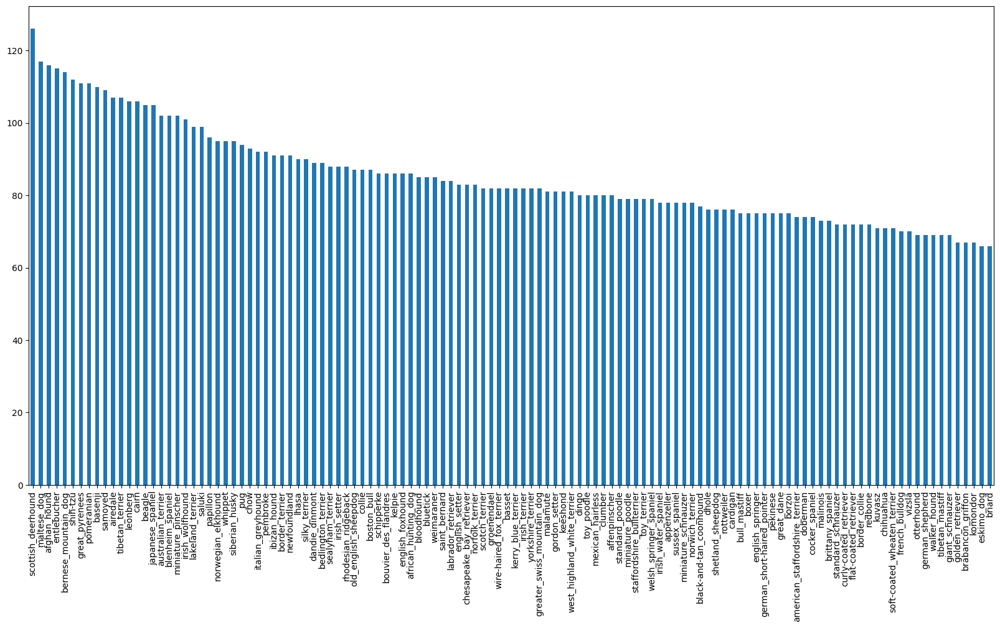

In [5]:
labels_csv.breed.value_counts().plot.bar(figsize = (20 , 10))

In [6]:
labels_csv.breed.value_counts().mean()

85.18333333333334

In [7]:
labels_csv.breed.value_counts().median()

82.0

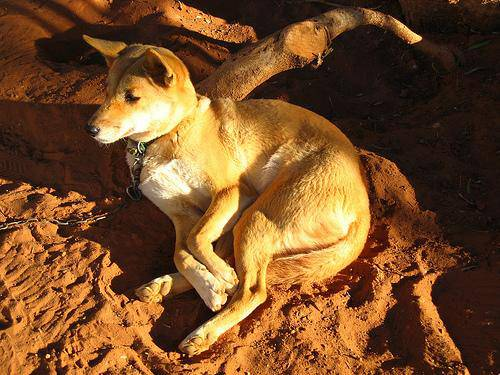

In [8]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

let's get a list of all our image file pathnames.

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/dog Vision/train/" + fname for fname in labels_csv["id"] + ".jpg"]

# Check the first 10
filenames[:10]

['drive/MyDrive/dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/dog Vision/train/")) == len(filenames):
  print("yes")
else :
  print("no")

yes


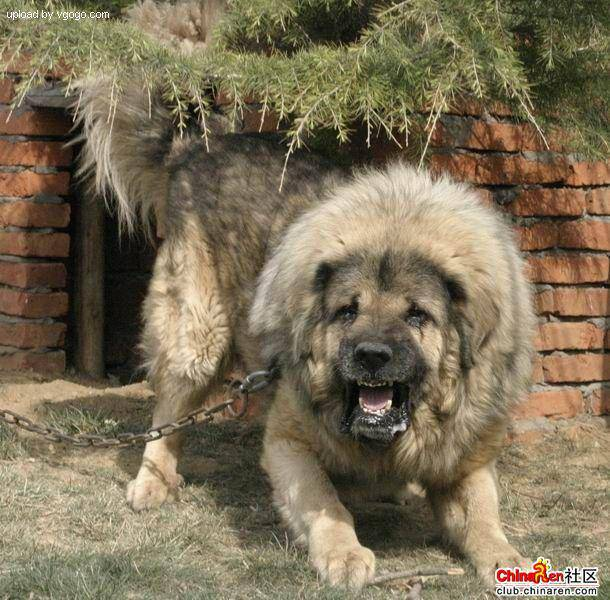

In [12]:
# One more check
Image(filenames[9000])

In [13]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list , let's prepare our labels.

In [14]:
labels = np.array(labels_csv.breed)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# See if number of labels matches the number of filenames

if len(labels) == len(filenames):
  print("yes")
else:
  print("no")

yes


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [18]:
len(unique_breeds)

120

In [19]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# Turn every label into a boolean library
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
# Example : Turning boolean array into integers
print(labels[0])  # original label

print(np.where(unique_breeds == labels[0]))  # index where label occurs

print(boolean_labels[0].argmax()) # index where label occurs in boolean array

print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validate set
Since the dataset from Kaggle comes with only train and test so we are going to create our own validation set.

In [22]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [23]:
len(X)

10222

In [24]:
len(y)

10222

We're going to start off experimenting with ~ 1000 images and increase as needed.

In [25]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10222, step:1000}

In [26]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into train and validation of total size NUM_IMAGES
X_train , X_val , y_train , y_val = train_test_split(X[:NUM_IMAGES] ,
                                                     y[:NUM_IMAGES] ,
                                                     test_size = 0.2 ,
                                                     random_state=42)

len(X_train) , len(X_val) , len(y_train) , len(y_val)

(800, 200, 800, 200)

In [27]:
# Let's have a geez at the training data
X_train[:5] , y_train[:5]

(['drive/MyDrive/dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input

2. Use Tenserflow to read the file and save it to a variable , `image`

3. Turn our `image` (a jpg) into Tensors

4. Resize the `image` to be a shape of (224 , 224)

5. Return the modified `image`

In [28]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [29]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [30]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [31]:
image.max() , image.min() # always between 0-255 for an image

(255, 0)

In [32]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path , img_size = IMG_SIZE):
  """
    Takes an image file path and turns the image into a Tensor
  """

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels (R,G,B)
  image = tf.image.decode_jpeg(image , channels=3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image , tf.float32)

  # Resize the image to our desired value
  image = tf.image.resize(image , size=[img_size , img_size])

  return image

## Turning our data into batches

Why turn our data into batches?

let's say you're trying to process 10000+ images in one go....... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image , label)`.

In [33]:
# Create a simple function to return a tuple (image , label)

def get_image_label(image_path , label):
  """
      Takes an image file path name and the associated label,
      processes the image and return a tuple of (image , label).
  """
  image = process_image(image_path)

  return image , label

In [34]:
# Demo of the above
(process_image(X[42]) , y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of tensors in the form : `(image , label)` , let's make a function to turn all of our data (X & y) into batches!

In [35]:
# Define the batch size , 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X , y=None , batch_size = BATCH_SIZE , valid_data = False , test_data = False):
  """
      Creates batches of data out of image (X) and label (y) pairs.
      Shuffles the data if it's training data but doesn't shuffle if it's validation data.
      Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches.........")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))   # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)

    return data_batch

  # If the data is a valid dataset , we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches.........")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X) , tf.constant(y)))   # filepaths and labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch

  # If the data is traning dataset
  else :
    print("Creating training data batches.........")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X) , tf.constant(y)))   # filepaths and labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch

In [36]:
# Create training and validation data batches
train_data = create_data_batches(X_train , y_train)
val_data = create_data_batches(X_val , y_val , valid_data=True)


Creating training data batches.........
Creating validation data batches.........


In [37]:
# Check out the different attributes of our data batches
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however , these can be hard to understand / comprehend.

Let's visualize them!

In [38]:
# Create a function for viewing images in a data batch
def show_25_images(images , labels):
  """
      Displays a plot of 25 images and their labels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10 , 10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)

    # Display an image
    plt.imshow(images[i])

    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn the grid lines off
    plt.axis("off")

In [39]:
train_images , train_labels = next(train_data.as_numpy_iterator())
train_images , train_labels

(array([[[[0.6392157 , 0.74509805, 0.8117648 ],
          [0.64254206, 0.7484244 , 0.81509113],
          [0.64705884, 0.75294125, 0.8196079 ],
          ...,
          [0.5882353 , 0.72156864, 0.8196079 ],
          [0.59278715, 0.7261205 , 0.82415974],
          [0.59278715, 0.7261205 , 0.82415974]],
 
         [[0.6392157 , 0.74509805, 0.8117648 ],
          [0.64254206, 0.7484244 , 0.81509113],
          [0.64705884, 0.75294125, 0.8196079 ],
          ...,
          [0.5882353 , 0.72156864, 0.8196079 ],
          [0.58431375, 0.7176471 , 0.81568635],
          [0.58431375, 0.7176471 , 0.81568635]],
 
         [[0.6392157 , 0.74509805, 0.8117648 ],
          [0.64254206, 0.7484244 , 0.81509113],
          [0.64705884, 0.75294125, 0.8196079 ],
          ...,
          [0.58431375, 0.7176471 , 0.81568635],
          [0.5882353 , 0.72156864, 0.8196079 ],
          [0.5882353 , 0.72156864, 0.8196079 ]],
 
         ...,
 
         [[0.60610026, 0.5551199 , 0.4923748 ],
          [0.61470

In [40]:
len(train_images) , len(train_labels) # 32 because batch size is 32

(32, 32)

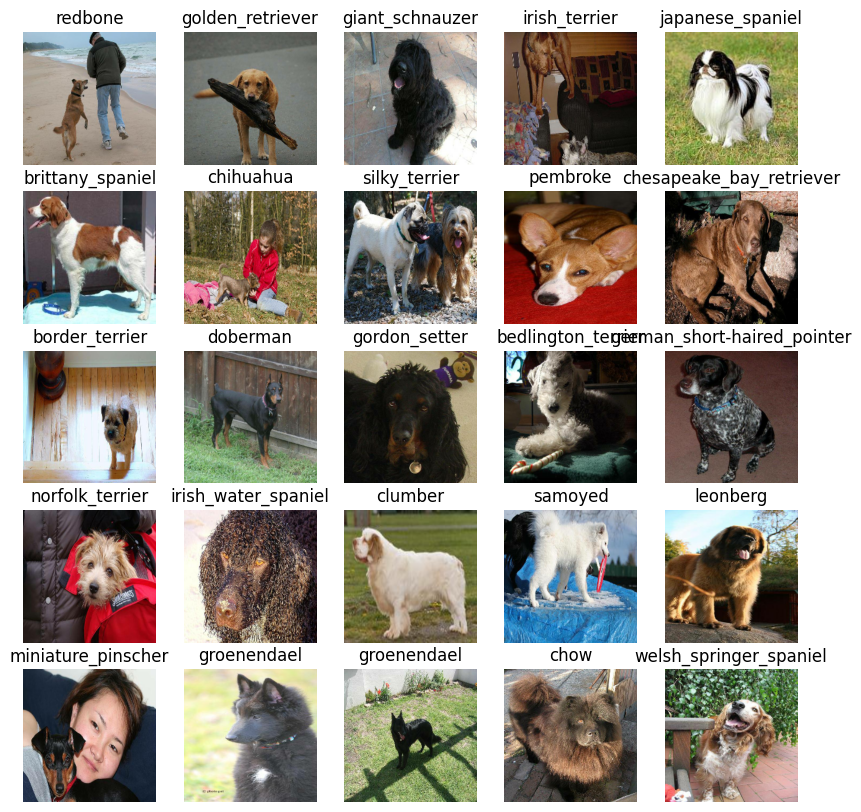

In [41]:
# Now let's visualize the data in a training batch
show_25_images(train_images , train_labels)

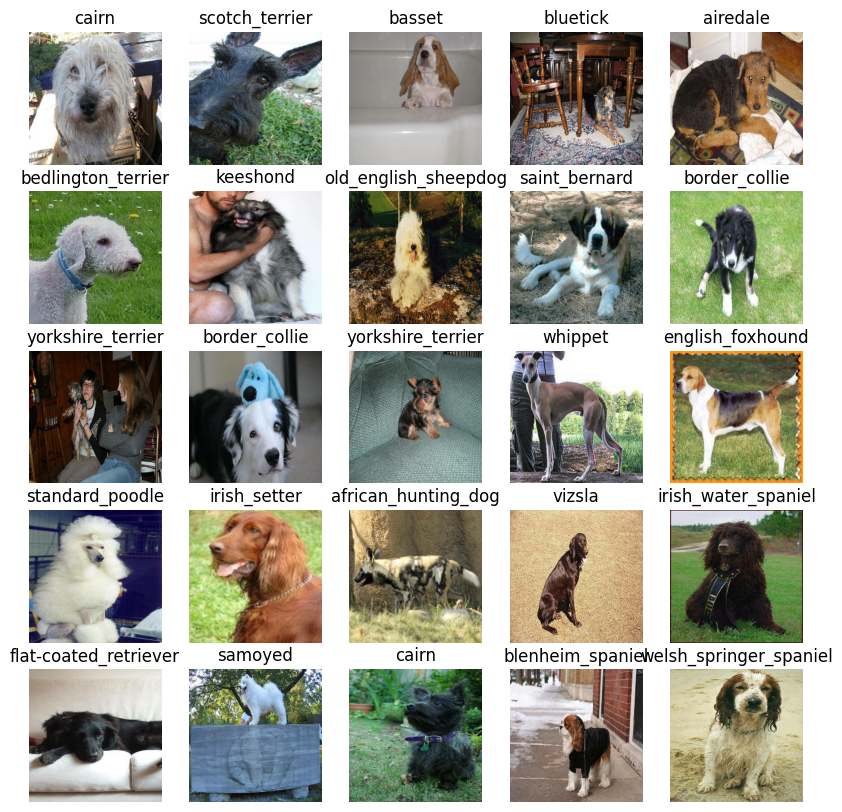

In [42]:
# Now let's visualize the data in a validation batch
val_images , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images , val_labels)

## Building a model
Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TenserFlow HUB.

In [43]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tenserflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go.
Let's put them togther into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.

* Defines the layers in a Keras model in sequential fashion
(do this first, then this, then that).

* Compiles the model (says it should be evaluated and improved).

* Builds the model (tells the model the input shape it'll be getting).

* Returns the model.

In [44]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE , output_shape = OUTPUT_SHAPE , model_url = MODEL_URL):
  """

  """

  print("Building model with:" , model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),  # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation="softmax")  # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  # return the model
  return model

In [45]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

* Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.


* We'll create two callbacks, one for TensorBooard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback , we need to do 3 things:
1. Load the tenserboard notebook extension.

2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.

3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [46]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [47]:
import datetime

# Create a function to build a TensorBoard logs
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/dog Vision/logs" ,
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  # Make it so the logs get tracked whenever we run an experiment

  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [48]:
# Create early stopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience = 3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [49]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains a model.

* Create a model using `create_model()`

* Setup a TensorBoard callback using `create_tensorboard_callback()`

* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.

* Return the model

In [50]:
# Build a function to train and return a trained model
def train_model():
  """
      Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data= val_data,
            validation_freq= 1,
            callbacks = [tensorboard , early_stopping])

  return model

In [51]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 181s 5s/step - loss: 4.6121 - accuracy: 0.1025 - val_loss: 3.5505 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 3s 125ms/step - loss: 1.6403 - accuracy: 0.7000 - val_loss: 2.2217 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 4s 151ms/step - loss: 0.5693 - accuracy: 0.9287 - val_loss: 1.7381 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 5s 203ms/step - loss: 0.2556 - accuracy: 0.9862 - val_loss: 1.5366 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 3s 122ms/step - loss: 0.1472 - accuracy: 0.9975 - val_loss: 1.4595 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 3s 122ms/step - loss: 0.1007 - accuracy: 1.0000 - val_loss: 1.4173 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================]

**Question:** It looks like our model is overfitting
because it's performing far better on the training dataset
than the validation dataset, what are some ways to
model overfitting in deep learning neural networks?


**Note:** Overfitting to begin with is a good thing! It
means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the log directory we created earlier and visualize its contents.

In [52]:
%tensorboard --logdir drive/MyDrive/dog\ Vision/logs --port=6007

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model


In [53]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data , verbose = 1)
predictions

7/7 [==============================] - 1s 94ms/step


array([[1.35294406e-03, 4.84688790e-04, 1.17404983e-04, ...,
        3.93079303e-04, 7.92002393e-05, 9.65215918e-03],
       [9.87379346e-03, 3.35276034e-03, 2.01750845e-02, ...,
        7.71988067e-04, 1.34234654e-03, 1.56672788e-04],
       [4.97574583e-05, 5.10079117e-05, 3.07992086e-05, ...,
        1.72528584e-04, 3.01315686e-05, 2.09828650e-04],
       ...,
       [9.23827338e-06, 1.57050265e-04, 4.48055565e-04, ...,
        6.69178116e-05, 3.41768551e-04, 1.10890316e-04],
       [6.80808793e-04, 1.11579815e-04, 1.22168029e-04, ...,
        1.61145275e-04, 6.78334618e-05, 1.22305537e-02],
       [1.06502778e-03, 8.29108685e-05, 8.50658212e-03, ...,
        1.07821468e-02, 1.86705904e-03, 1.18523836e-04]], dtype=float32)

In [54]:
predictions.shape

(200, 120)

In [55]:
len(y_val)

200

In [56]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction):  {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Index of Max prob : {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")

[6.17108453e-05 1.55987262e-04 1.85766941e-04 4.99554772e-05
 6.55898824e-03 2.07748919e-04 2.06332115e-04 1.79072493e-03
 1.09212240e-02 2.35652011e-02 5.72041499e-05 3.32020754e-05
 8.28746823e-04 4.53878520e-03 1.02712656e-03 1.96269806e-03
 5.94121138e-06 2.99805484e-04 4.26022540e-04 1.61195209e-03
 2.25900840e-05 1.68854313e-03 5.09559686e-05 1.02379468e-04
 1.04852933e-02 4.79854847e-04 6.63258324e-05 7.84573203e-05
 1.30154614e-04 1.73218810e-04 5.90922609e-05 2.99923326e-04
 3.31902993e-05 4.84661832e-05 4.81299008e-04 6.04536253e-05
 5.21676149e-04 7.71753897e-04 2.01674164e-04 4.58405912e-01
 2.04540571e-04 2.97630577e-05 2.66047474e-02 1.30267445e-05
 2.19636480e-04 7.71768173e-05 8.65020615e-04 1.47334801e-03
 1.13127877e-04 7.78047950e-04 2.22340910e-04 1.29316212e-03
 8.05986463e-04 3.12853348e-03 3.29377581e-05 1.07445591e-03
 5.80720734e-05 1.09035915e-04 1.03110535e-04 1.69507166e-05
 1.73450404e-04 1.57974940e-03 9.65155232e-06 1.22920756e-04
 4.91788320e-04 9.817028

Having the above functionality is great but we want to be able to do it at scale

And it would be even better if we could see the image the predictions is being made on!

**Note:** prediction probabilities are also known as confidence levels.

In [57]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
      Turns an array of prediction probabilities into a label.
  """

  return unique_breeds[np.argmax(prediction_probabilities)]


# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset ,
we'll have to unbatchify it to make predictions on the validation images and then
compares those predictions to the validation labels (truth labels)

In [58]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [70]:
# Create a function to unbatch a batch dataset
def unbatchify (data):
  """
    Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
    of images and labels.
  """

  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator() :
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images , val_labels = unbatchify(val_data)
val_images[0] , val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [71]:
get_pred_label(val_labels[0])

'affenpinscher'

In [72]:
unique_breeds[np.argmax(val_labels[0])]

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.

* Convert the predictions probabilities to a predicted label.

* Plot the predicted label , its predicted probability, the truth label and the target image on a single plot.

In [62]:
def plot_pred(prediction_probabilities , labels , images , n=1):
  """
      View the prediction , ground truth and image for sample n
  """

  pred_prob, true_label , image = prediction_probabilities[n] , labels[n] , images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title
  if pred_label == true_label:
    color = "green"

  else:
    color = "red"

  # Change plt title to be predicted , probability of predictions and truth label
  plt.title("{}{:0.2f}%{}".format(pred_label,
                                  np.max(pred_prob) * 100,
                                  true_label),
                                  color=color)


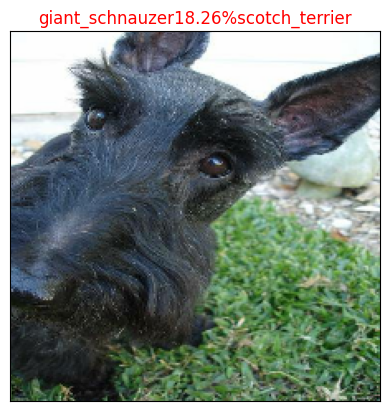

In [63]:
plot_pred(prediction_probabilities = predictions , labels=val_labels,
          images = val_images)


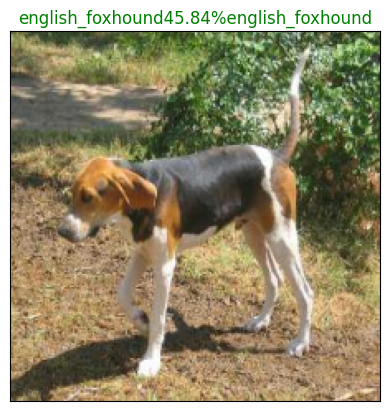

In [64]:
plot_pred(prediction_probabilities = predictions , labels=val_labels,
          images = val_images,
          n = 42)

Now we've got one function to visualize our models top predicitions. let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth and an integer
* Find the predictions using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels , coloring the true label as green

In [73]:
def plot_pred_conf(prediction_probabilities , labels , n= 1):
  """
      Plot the top 10 highest prediction confidences along with the true label for sample n.
  """

  pred_prob , true_label = prediction_probabilities[n] , labels[n]

  # Get the predictied label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change color of true label
  if np.isin(true_label , top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label )].set_color("green")
  else:
    pass

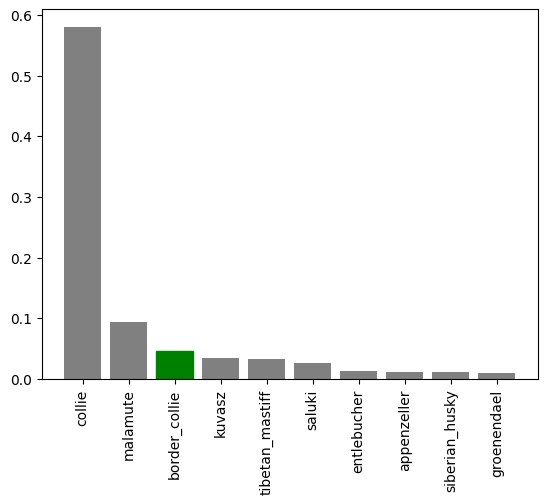

In [74]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=9)

Now we've got some function to help our visualize our predictions and evaluate our model, let's check out a few

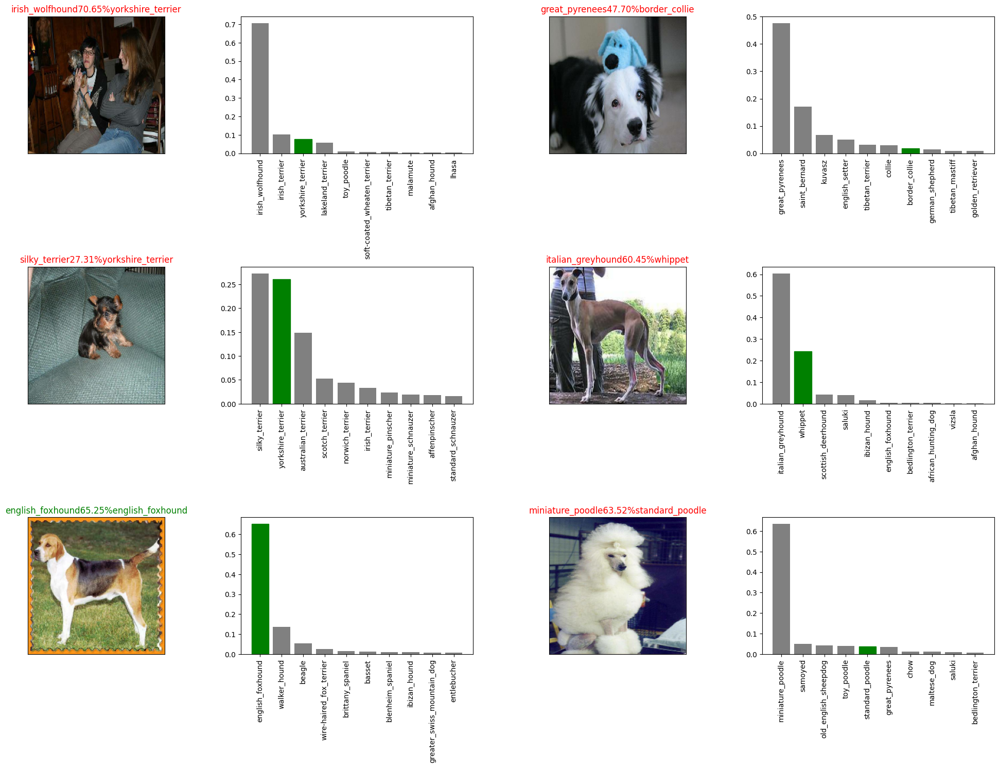

In [79]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols , 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows , 2 * num_cols , 2 *i + 1)
  plot_pred(prediction_probabilities=predictions ,
            labels = val_labels ,
            images = val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows , 2 * num_cols , 2 * i + 2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels ,
                 n = i + i_multiplier)
plt.tight_layout()
plt.show()

## Saving and reloading a trained model

In [80]:
# Create a function to save a model
def save_model(model , suffix = None):
  """
  Saves a given model in a model directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}.....")
  model.save(model_path)

  return model_path

In [85]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})

  return model

Now we've got functions to save and load a trained model , let's make sure they work!

In [86]:
# Save our model trained on 1000 images
save_model(model , suffix = "1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/dog Vision/models/20230819-12001692446447-1000-images-mobilenetv2-Adam.h5.....


'drive/MyDrive/dog Vision/models/20230819-12001692446447-1000-images-mobilenetv2-Adam.h5'

In [87]:
# Load a trained model
Loaded_1000_image_model = load_model("drive/MyDrive/dog Vision/models/20230819-11511692445892-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/dog Vision/models/20230819-11511692445892-1000-images-mobilenetv2-Adam.h5


In [88]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 111ms/step - loss: 1.3266 - accuracy: 0.6450


[1.3265539407730103, 0.6449999809265137]

In [89]:
# Evaluate the loaded model
Loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 141ms/step - loss: 1.3266 - accuracy: 0.6450


[1.3265539407730103, 0.6449999809265137]

## Training a big dog model (on the full data)

In [90]:
len(X) , len(y)

(10222, 10222)

In [91]:
X[:10]

['drive/MyDrive/dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [92]:
# Create a data batch with the full data set
full_data = create_data_batches(X , y)

Creating training data batches.........


In [93]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [94]:
# Create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [95]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data , so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note:** Running the cell below will take a little while (maybe upto 30 mins for the first epoch)

In [96]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard , full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 113ms/step - loss: 1.3582 - accuracy: 0.6679
Epoch 2/100
320/320 [==============================] - 35s 109ms/step - loss: 0.4017 - accuracy: 0.8787
Epoch 3/100
320/320 [==============================] - 37s 114ms/step - loss: 0.2365 - accuracy: 0.9369
Epoch 4/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1548 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 35s 109ms/step - loss: 0.1081 - accuracy: 0.9762
Epoch 6/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0779 - accuracy: 0.9853
Epoch 7/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0594 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0449 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0382 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 35s 110m

In [97]:
save_model(full_model , suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/dog Vision/models/20230819-12361692448608-full-image-set-mobilenetv2-Adam.h5.....


'drive/MyDrive/dog Vision/models/20230819-12361692448608-full-image-set-mobilenetv2-Adam.h5'

In [98]:
Loaded_full_model = load_model("drive/MyDrive/dog Vision/models/20230819-12361692448608-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/dog Vision/models/20230819-12361692448608-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches , to make predictions on the test data , we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convey them into Tensor batches.

To make predictions on the test data , we'll:
* Get the test image filenames

* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).

* Make a predictions array by passing the test batches to the `predict()` method call in our model.

In [100]:
# Load test image filenames
test_path = "drive/MyDrive/dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog Vision/test/e1f7ec4bd372612f53411026aaabf233.jpg',
 'drive/MyDrive/dog Vision/test/e1f4d57ee24b11a0d1a24b83e12d6bb7.jpg',
 'drive/MyDrive/dog Vision/test/e6a0eeb3e82e14eb812d9ef22383ec11.jpg',
 'drive/MyDrive/dog Vision/test/e22db0abd7c039726b9683fc0a372204.jpg',
 'drive/MyDrive/dog Vision/test/e278b2f68fa5d146e0bf06eee5faa0e3.jpg',
 'drive/MyDrive/dog Vision/test/dddb2b191e1b1de4867f6f5e81236312.jpg',
 'drive/MyDrive/dog Vision/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg',
 'drive/MyDrive/dog Vision/test/e4369279919beecfb6d91a5375bc122f.jpg',
 'drive/MyDrive/dog Vision/test/e55d2fced9eb7e46aef5bdb288145fa4.jpg',
 'drive/MyDrive/dog Vision/test/e193c532dc7c9a5ee397848a1ee007f0.jpg']

In [101]:
len(test_filenames)

10357

In [102]:
# Create test data batch
test_data = create_data_batches(test_filenames , test_data=True)

Creating test data batches.........


In [103]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our model and passing it the test data batch will take a long time to run.

In [105]:
# Make predictions on test data batch using the loaded full model
test_predictions = Loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 3505s 11s/step


In [106]:
# Save predictions (Numpy array) to csv file (for acess later)
np.savetxt("drive/MyDrive/dog Vision/preds_array.csv" , test_predictions , delimiter = ",")

In [107]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/dog Vision/preds_array.csv" , delimiter = ",")

In [108]:
test_predictions[:10]

array([[1.07759945e-09, 5.99307826e-10, 1.10270890e-11, ...,
        7.35508117e-14, 1.34060167e-11, 2.36539109e-12],
       [4.70465835e-07, 1.30766606e-08, 7.51585458e-06, ...,
        1.88753415e-06, 1.15388108e-03, 1.07255355e-05],
       [2.40166571e-07, 9.95491156e-09, 6.19295815e-09, ...,
        4.14317336e-09, 8.29919190e-06, 1.19274421e-06],
       ...,
       [8.55189937e-05, 2.79148537e-07, 7.16221571e-09, ...,
        1.85034654e-08, 2.66189591e-06, 1.58620023e-04],
       [3.51722151e-10, 1.72963386e-08, 2.02848871e-09, ...,
        1.16659349e-08, 4.69650558e-08, 1.80370492e-08],
       [8.65456928e-10, 2.77414674e-05, 3.56876617e-09, ...,
        7.42421662e-08, 1.96915853e-08, 7.91502597e-09]])

In [109]:
test_predictions.shape

(10357, 120)